# Set up

In [4]:
import tensorflow as tf
import tensorflow.keras as tfk
import numpy as np
import random

import augmentation as augh
import plotter as plot
import folding as fold

print("Libraries have been imported")

Libraries have been imported


# Test set split

In [6]:
data_set = np.load("/kaggle/input/bloodcells-filtered/dataset_filtered.npz")
test_set, free_set = fold.split_set(data_set, count=150, shuffle=False)

print(f"Data set: {data_set['images'].dtype}{data_set['images'].shape} - {data_set['labels'].dtype}{data_set['labels'].shape}")
print(f"Test set: {test_set['images'].dtype}{test_set['images'].shape} - {test_set['labels'].dtype}{test_set['labels'].shape}")
print(f"Free set: {free_set['images'].dtype}{free_set['images'].shape} - {free_set['labels'].dtype}{free_set['labels'].shape}")

np.savez("dataset_test.npz", **test_set)
np.savez("dataset_free.npz", **free_set)

Data set: uint8(11959, 96, 96, 3) - uint8(11959, 1)
Test set: uint8(1200, 96, 96, 3) - uint8(1200, 1)
Free set: uint8(10759, 96, 96, 3) - uint8(10759, 1)


# Free dataset import

In [8]:
data = np.load("/kaggle/input/bloodcells-free/dataset_free.npz")
# data = np.load("/kaggle/input/bloodcells-filtered/dataset_filtered.npz")

images = data['images']
labels = data['labels']
print(f"images: {images.dtype}{images.shape}")
print(f"labels: {labels.dtype}{labels.shape}")

images: uint8(11959, 96, 96, 3)
labels: uint8(11959, 1)


# Example augmentation

input image: uint8(96, 96, 3)
output image: uint8(96, 96, 3)
input image range: (8, 255)
output image range: (0, 255)


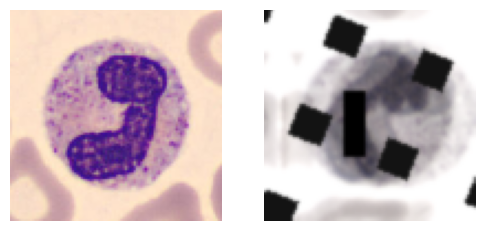

In [6]:
image = random.choice(images)
augmented_image = augh.augment(image)

print(f"input image: {image.dtype}{image.shape}")
print(f"output image: {augmented_image.dtype}{augmented_image.shape}")
print(f"input image range: ({image.min()}, {image.max()})")
print(f"output image range: ({augmented_image.min()}, {augmented_image.max()})")

plot.plot_image(image, augmented_image)

# Augment dataset

In [5]:
augmented_data = augh.augment_set(data, top=5000)

# Export dataset

In [8]:
np.savez("dataset_evaluation.npz", **augmented_data)
# np.savez("dataset_maximisation.npz", **augmented_data)

# Show dataset distribution

original dataset images: uint8(11959, 96, 96, 3)
augmented dataset images: uint8(40000, 96, 96, 3)
original dataset labels: uint8(11959, 1)
augmented dataset labels: uint8(40000, 1)


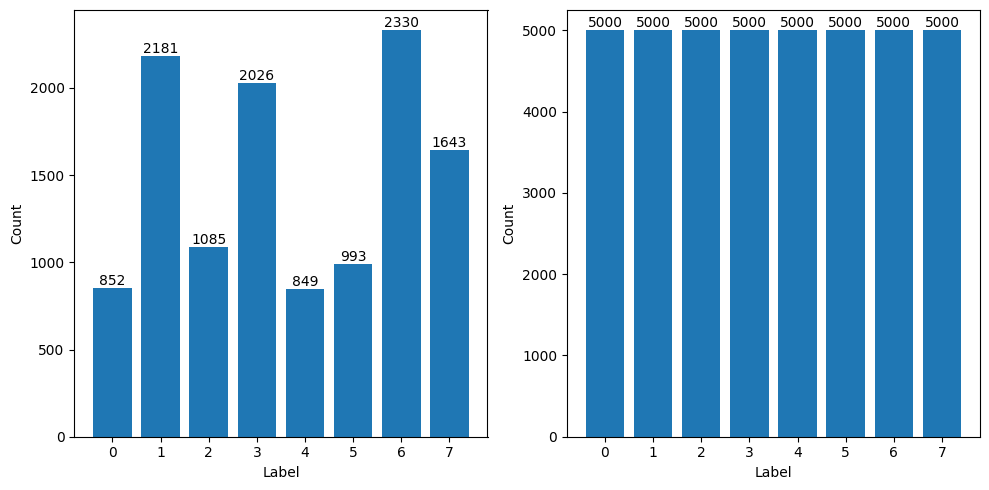

In [9]:
augmented_images = augmented_data['images']
augmented_labels = augmented_data['labels']

print(f"original dataset images: {images.dtype}{images.shape}")
print(f"augmented dataset images: {augmented_images.dtype}{augmented_images.shape}")
print(f"original dataset labels: {labels.dtype}{labels.shape}")
print(f"augmented dataset labels: {augmented_labels.dtype}{augmented_labels.shape}")

plot.plot_distribution(data['labels'], augmented_data['labels'])

# Print some images

Class: 1/8


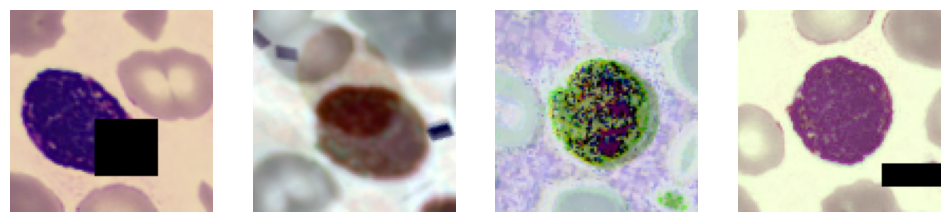

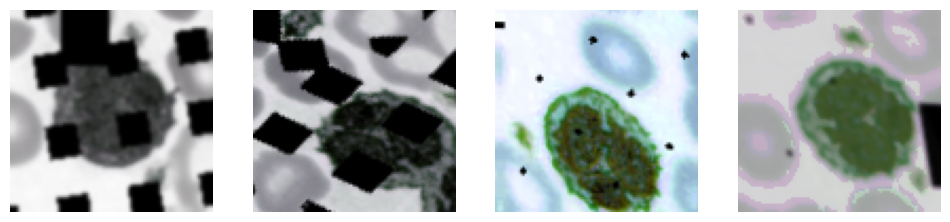

Class: 2/8


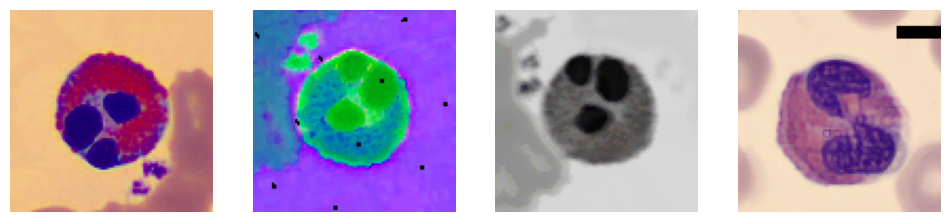

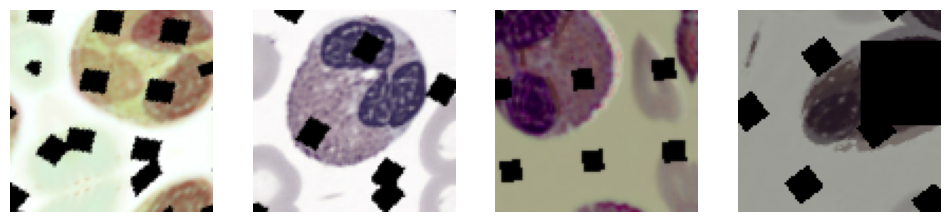

Class: 3/8


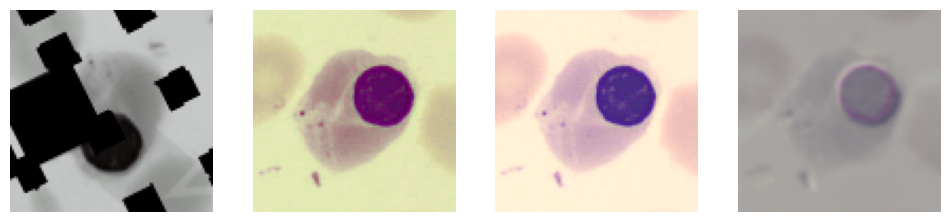

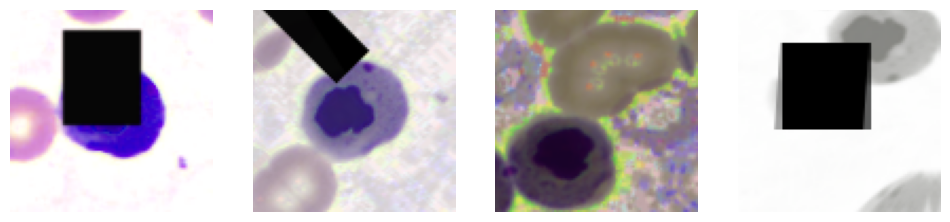

Class: 4/8


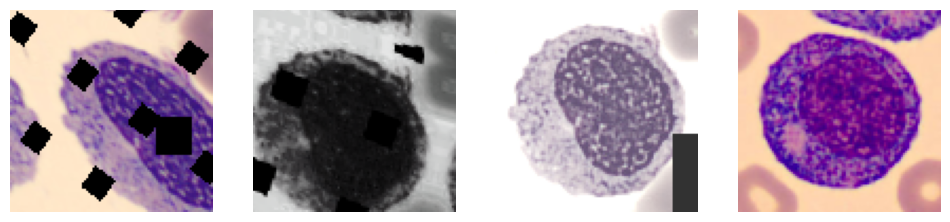

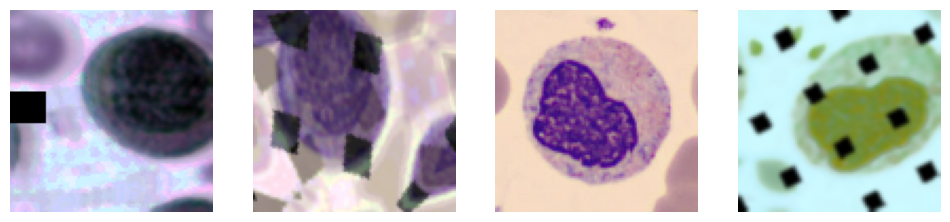

Class: 5/8


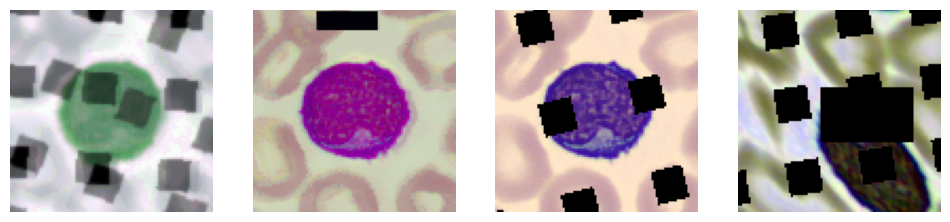

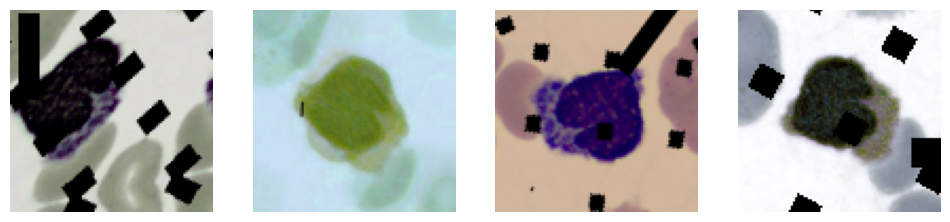

Class: 6/8


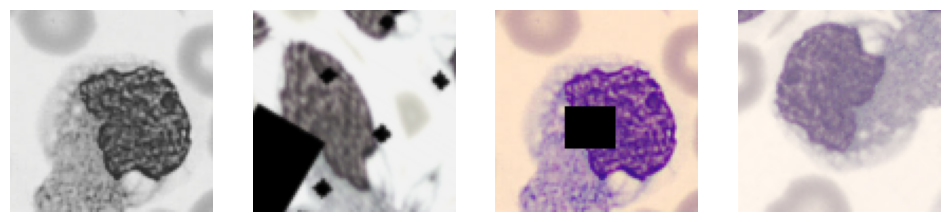

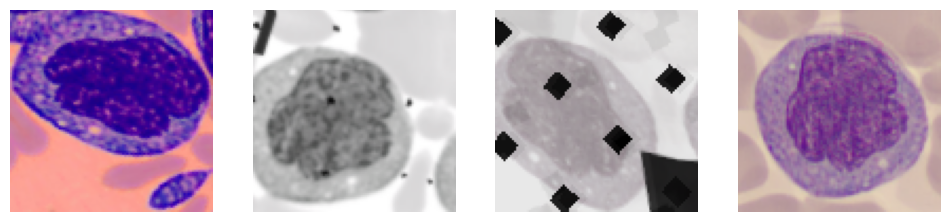

Class: 7/8


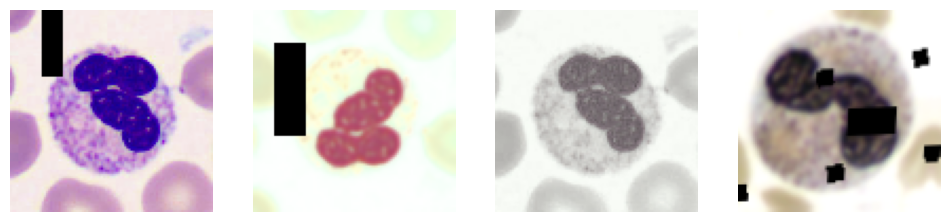

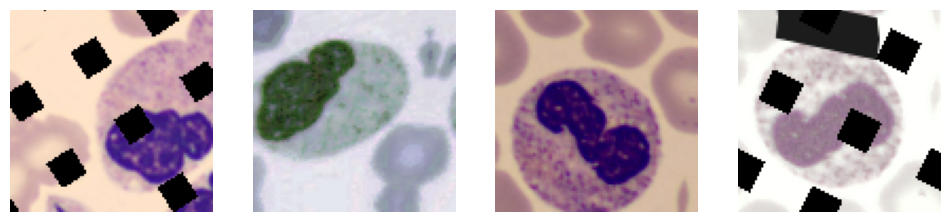

Class: 8/8


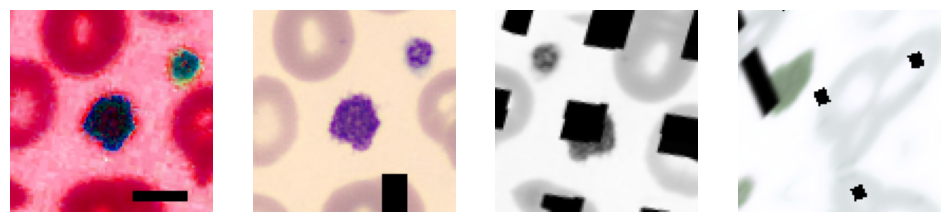

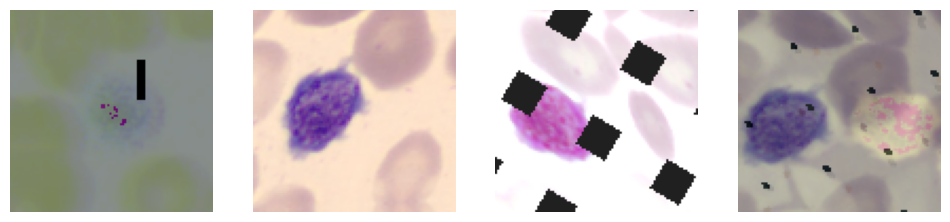

In [10]:
plot.print_example_images(augmented_images, augmented_labels, row=4)

# Split dataset

In [23]:
validation, training = fold.split_set(augmented_data)

# Show datasets distributions after split

original dataset images: uint8(10759, 96, 96, 3)
validation dataset images: uint8(4800, 96, 96, 3)
training dataset images: uint8(19200, 96, 96, 3)
original dataset labels: uint8(10759, 1)
validation dataset labels: uint8(4800, 1)
training dataset labels: uint8(19200, 1)


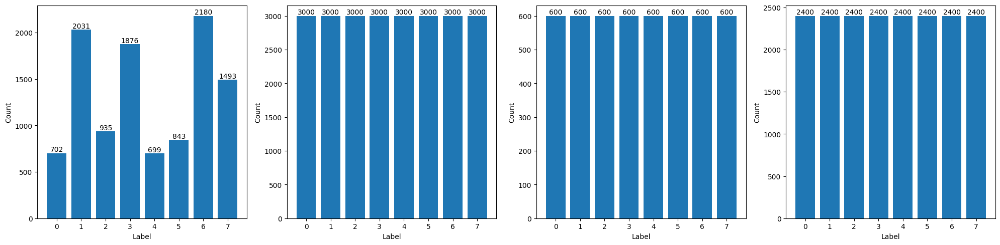

In [24]:
val_images = validation['images']
val_labels = validation['labels']
train_images = training['images']
train_labels = training['labels']

print(f"original dataset images: {images.dtype}{images.shape}")
print(f"validation dataset images: {val_images.dtype}{val_images.shape}")
print(f"training dataset images: {train_images.dtype}{train_images.shape}")
print(f"original dataset labels: {labels.dtype}{labels.shape}")
print(f"validation dataset labels: {val_labels.dtype}{val_labels.shape}")
print(f"training dataset labels: {train_labels.dtype}{train_labels.shape}")

plot.plot_distribution(data['labels'], augmented_data['labels'], validation['labels'], training['labels'])

# Print example images after split

VALIDATION
Class: 1/8


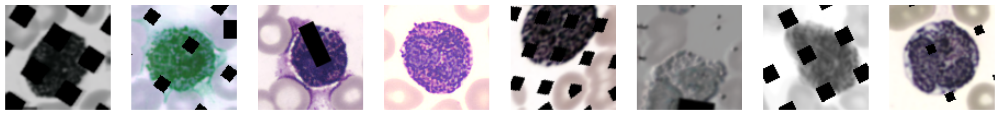

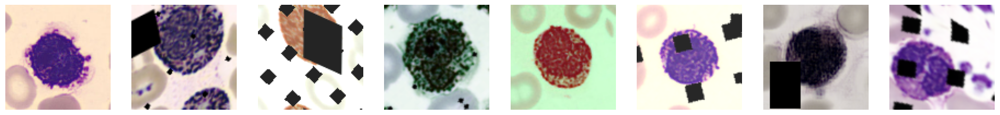

Class: 2/8


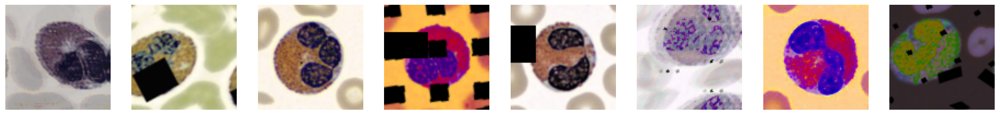

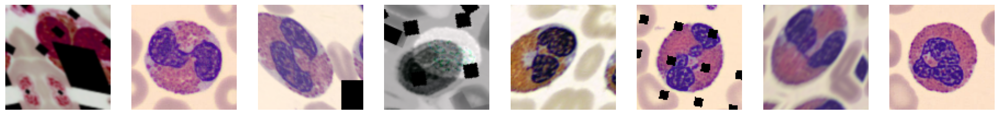

Class: 3/8


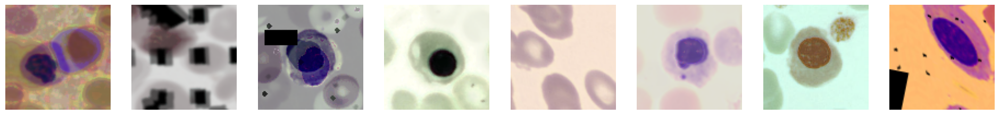

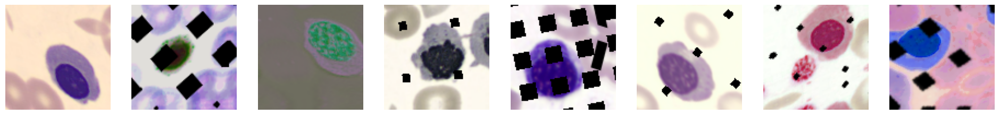

Class: 4/8


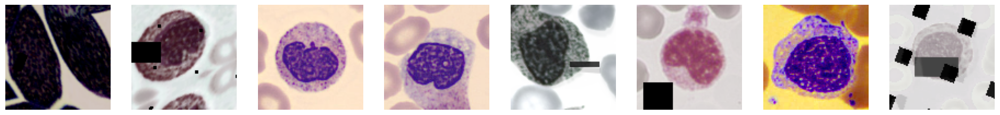

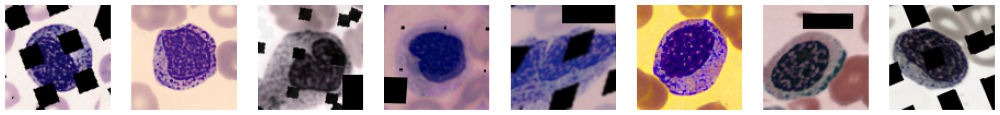

Class: 5/8


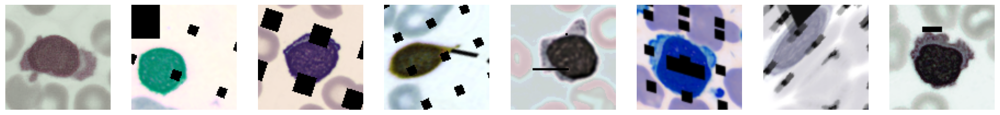

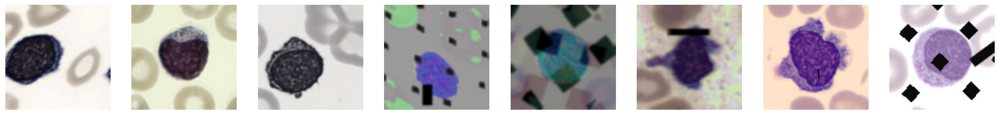

Class: 6/8


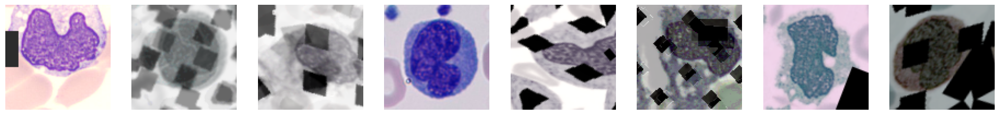

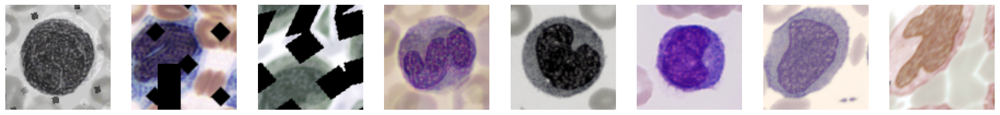

Class: 7/8


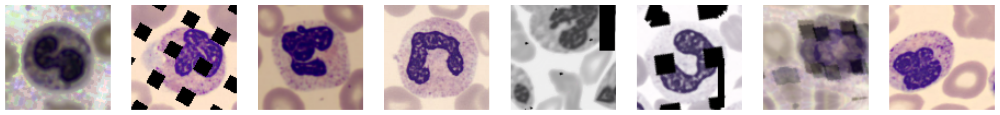

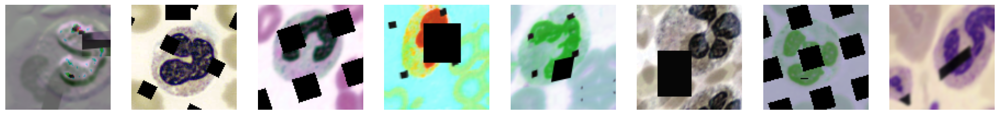

Class: 8/8


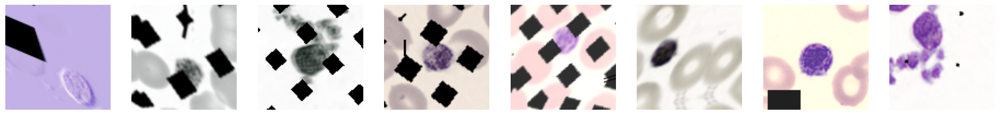

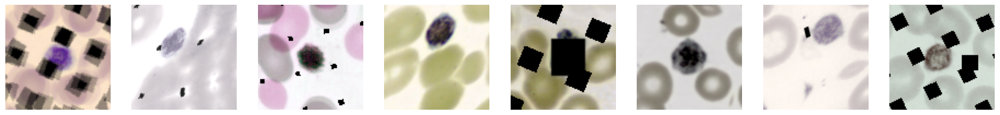

TRAINING
Class: 1/8


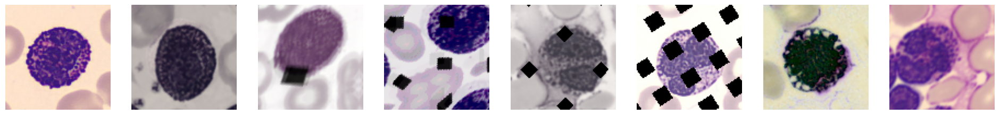

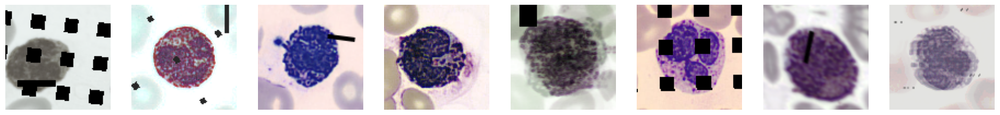

Class: 2/8


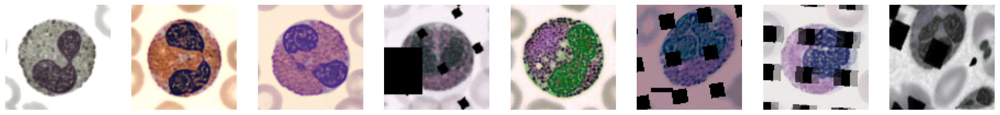

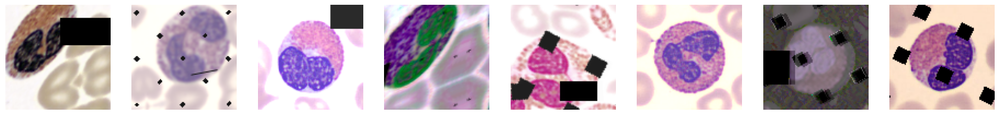

Class: 3/8


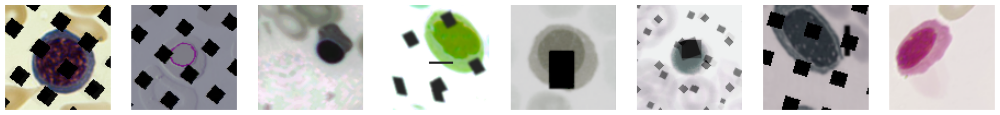

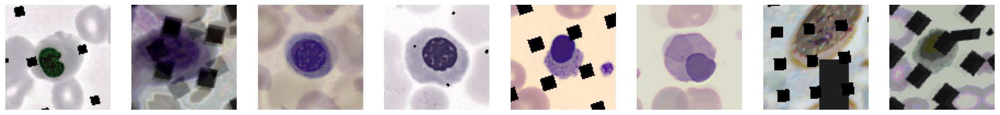

Class: 4/8


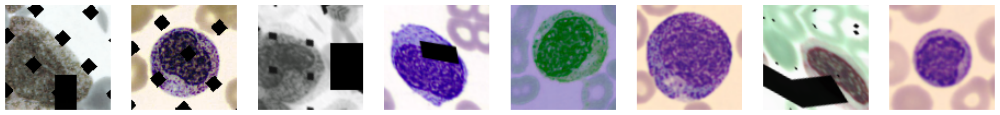

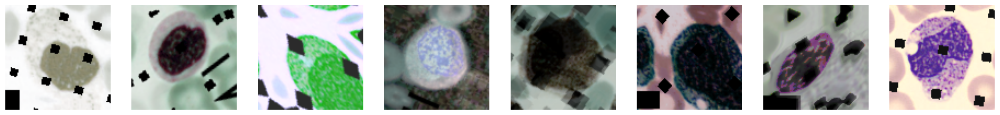

Class: 5/8


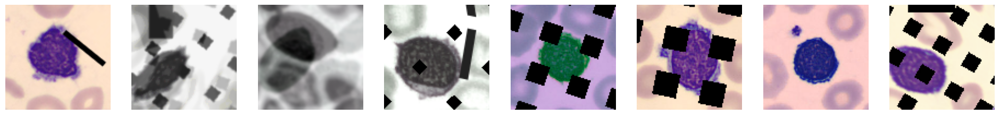

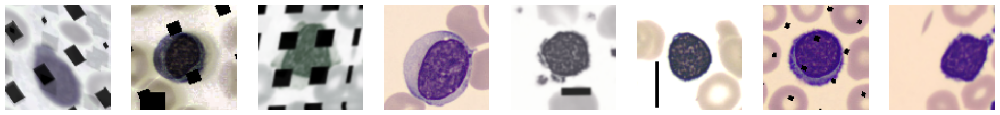

Class: 6/8


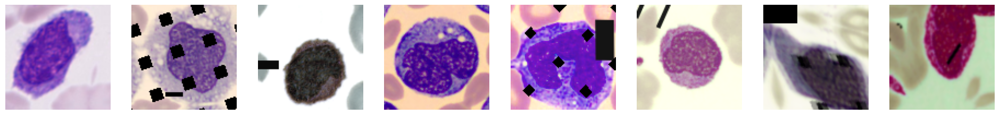

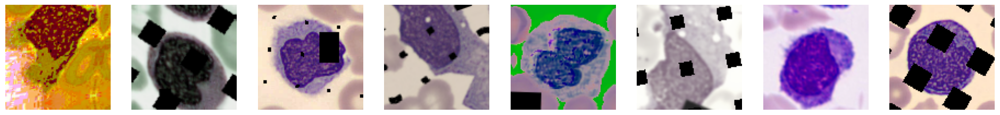

Class: 7/8


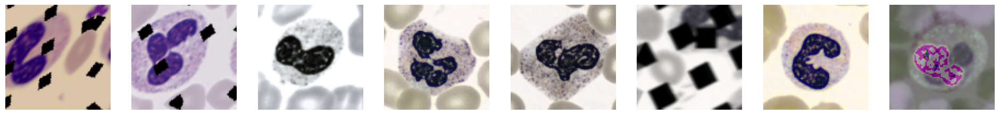

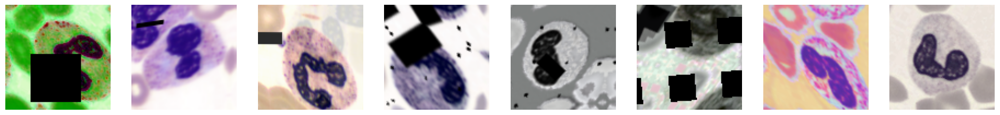

Class: 8/8


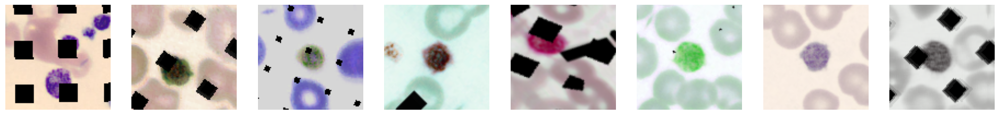

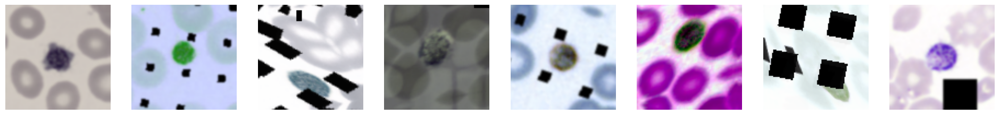

In [26]:
print("VALIDATION")
plot.print_example_images(validation['images'], validation['labels'])
print("TRAINING")
plot.print_example_images(training['images'], training['labels'])